# Week 4


By Group XX:

-   Aleksandar Lukic - s194066
-   Paula Barho - s242926
-   Victor Gustav Harbo Rasmussen - s204475

#### Preamble

In [1]:
import matplotlib.pyplot as plt
import os
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats

In [2]:
# Set pandas display options to show all columns for .head command
pd.set_option("display.max_columns", None)  # Show all columns
pd.set_option("display.width", None)        # Auto-detect the display width
pd.set_option("display.max_colwidth", None) # Show full content of each column

In [3]:
# Get path of data directory
files_path = os.path.abspath(os.path.join(os.pardir, "files"))
files_path

'c:\\Users\\Aleksandar\\School\\02806_Social_Data\\files'

In [4]:
# Get path of plot directory
plots_path = os.path.abspath(os.path.join(os.pardir, "plots"))
plots_path

'c:\\Users\\Aleksandar\\School\\02806_Social_Data\\plots'

In [5]:
# Read crime data from the CSV file
data_path = os.path.abspath(os.path.join(os.pardir, "data"))
csv_name = "Police_Department_Incident_Reports_Complete.csv"
df = pd.read_csv(os.path.join(data_path, csv_name))

## Part 1: More lecturing on dataviz

We begin today by learning more about the theory of visualization, digging into data encodings and representations.

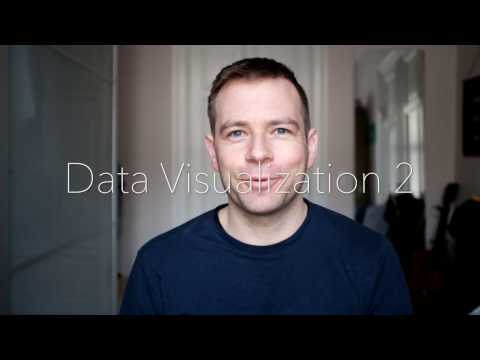

In [6]:
from IPython.display import YouTubeVideo
YouTubeVideo('zE6Nr8trdrw', width=800, height=450)

> *Excercise:* Some questions about the video. 

> * Mention 10 examples of ways we can encode data.

1. Position
2. Length
3. Area
4. Shape
5. Color
6. Angle
7. Line weight
8. Line ending
9. Texture
10. Pattern

> * Are all encodings created equally? Why not? Can you think of an example from the previous lectures?

Some encodings, such as _Length_ and _Position_, are simple to grasp as their is little interpretation needed. Comparing to 1D lines is very simple for the eye to do, as well as locating a star on a city-map. Large graphs can be combersume to visualise and evenmore so to comprehend visualy.

> * Mention 3 encodings that are difficult for the human eye to parse. Can you find an example of a visualization online that uses one of those three?

1. **Angles**: Pie charts demand close inspection for fully understanding the data, i.e. not clear at an eye-glance.
2. **Area**: Same issue as with angles, if the areas are similar in size.
3. **Color**: If gradient scales are used, this can be almost impossible to decipher without actual numeric values as aid.

> * Explain in your own words: What is the problem with pie-charts?

The pie chart can be a very effecient way of conveying an agenda. Say, that we want to visualise the market shares of "_Milk_", where 42% is held by conventional dairy milk, 51% organic dairy milk, and only 7% vegan milk alternatives. This pie chart will quickly show a clear depiction of the overwhelming share of cow milk in the market. However, say we are now interested in stating the different kinds of milks within each category; skimmed milk, full-fat, oat, almond, soy etc. this quickly makes the pie chart over-ambitious and hard to read!

## Part 2: Visualizing geo-data

It turns out that `plotly` (which we used during Week 2) is not the only way of working with geo-data. There are many different ways to go about it. (The more advanced PhD and PostDoc researchers in my group simply use matplotlib, since that provides more control.)

Today, we'll try another library for geodata called [Folium](https://github.com/python-visualization/folium). It's good for you all to try out a few different libraries - remember that data visualization and analysis in Python is all about the ability to use many different tools. 

The exercise below is based on the code illustrated in this nice [tutorial](https://www.kaggle.com/daveianhickey/how-to-folium-for-maps-heatmaps-time-data), so let us start by taking a look at that one.

*Reading*. Read through the following tutorial
 * "How to: Folium for maps, heatmaps & time data". Get it here: https://www.kaggle.com/daveianhickey/how-to-folium-for-maps-heatmaps-time-data. \[**UPDATE 2025**: This is still a great tutorial, but the Stamen tiles are no longer avialible, so some of the plots won't display. You can still run everything, however. \]
 * <font color=gray>You can also experiment with getting your LLM to generate a nice tutorial for you, if you're so inclined.</font>

In [7]:
%%capture
%pip install folium

> *Exercise*: A different take on geospatial data. 
>
>A couple of weeks ago (Part 3 of Week 2), we worked with spacial data by using color-intensity of shapefiles to show the counts of certain crimes within those individual areas. Today, we look at studying geospatial data by plotting raw data points as well as heatmaps on top of actual maps.

![example](https://raw.githubusercontent.com/suneman/socialdata2025/main/files/simple_map.png)

> * First start by plotting a map of San Francisco with a nice tight zoom. Simply use the command `folium.Map([lat, lon], zoom_start=13)`, where you'll have to look up San Francisco's longitude and latitude.

In [8]:
import folium

Coordinates for San Fransisco where found at [LatLong.net](https://www.latlong.net/place/san-francisco-ca-usa-594.html).

In [22]:
sf_cord = [37.773972, -122.431297]

In [26]:
folium_map = folium.Map(location=[sf_cord[0], sf_cord[1]], zoom_start=13)
folium_map


> * Next, use the the coordinates for SF City Hall `37.77919, -122.41914` to indicate its location on the map with a nice, pop-up enabled marker.

In [24]:
sf_ch_cord = [37.77919, -122.41914]

In [27]:
folium.Marker([sf_ch_cord[0], sf_ch_cord[1]], popup='San Fransisco City Hall').add_to(folium_map)

folium_map

> * Now, let's plot some more data (no need for pop-ups this time). Select a couple of months of data for `'DRUG/NARCOTIC'` and draw a little dot for each arrest for those two months. You could, for example, choose June-July 2016, but you can choose anything you like - the main concern is to not have too many points as this uses a lot of memory and makes Folium behave non-optimally. 
> We can call this kind of visualization a *point scatter plot*.

In [38]:
df_sample = df[df["Category"] == "DRUG/NARCOTIC"]
df_sample = df_sample[df_sample["Year"] == 2016]
df_sample = df_sample[df_sample["Month"].isin([6,7])]
df_sample

,Category,Police District,Longitude (X),Latitude (Y),Day of Week,Hour,Minute,Day,Month,MonthName,Year
1849604,DRUG/NARCOTIC,SOUTHERN,-122.402844,37.785718,Wednesday,11,59,1,6,June,2016
1849635,DRUG/NARCOTIC,MISSION,-122.419672,37.765050,Wednesday,12,10,1,6,June,2016
1849648,DRUG/NARCOTIC,SOUTHERN,-122.412515,37.780478,Wednesday,12,55,1,6,June,2016
1849649,DRUG/NARCOTIC,SOUTHERN,-122.412515,37.780478,Wednesday,12,55,1,6,June,2016
1849668,DRUG/NARCOTIC,TENDERLOIN,-122.415414,37.784477,Wednesday,13,58,1,6,June,2016
...,...,...,...,...,...,...,...,...,...,...,...
1872766,DRUG/NARCOTIC,NORTHERN,-122.430996,37.787280,Sunday,13,55,31,7,July,2016
1872826,DRUG/NARCOTIC,MISSION,-122.430604,37.760752,Sunday,16,17,31,7,July,2016
1872896,DRUG/NARCOTIC,MISSION,-122.429778,37.765241,Sunday,19,40,31,7,July,2016
1872899,DRUG/NARCOTIC,MISSION,-122.429778,37.765241,Sunday,19,40,31,7,July,2016


In [74]:
for index, row in df_sample.iterrows():
    folium.CircleMarker(
        location=[row["Latitude (Y)"], row["Longitude (X)"]], 
        radius=10,
        color='black',
        fill=False,
        fill_color='red',
        fill_opacity=0.5,
        tooltip=f"Reported: {row["Day"]}/{row["Month"]}/{row["Year"]} at {row["Hour"]:02d}:{row["Minute"]:02d}"
    ).add_to(folium_map)

folium_map

> *Exercise*: Heatmaps.
> Now, let's play with **heatmaps**. You can figure out the appropriate commands by grabbing code from the main [tutorial](https://www.kaggle.com/daveianhickey/how-to-folium-for-maps-heatmaps-time-data)) and modifying to suit your needs.

In [120]:
from folium import plugins
from folium.plugins import HeatMap

>    * To create your first heatmap, grab all arrests for the category `'PROSTITUTION'` across all time. Play with parameters to get plots you like.

In [121]:
df_sample = df[df["Category"] == "PROSTITUTION"]
df_sample

,Category,Police District,Longitude (X),Latitude (Y),Day of Week,Hour,Minute,Day,Month,MonthName,Year
35,PROSTITUTION,TENDERLOIN,-122.416075,37.784450,Wednesday,0,1,1,1,January,2003
546,PROSTITUTION,TENDERLOIN,-122.416075,37.784450,Wednesday,22,35,1,1,January,2003
548,PROSTITUTION,TENDERLOIN,-122.416075,37.784450,Wednesday,22,40,1,1,January,2003
569,PROSTITUTION,TENDERLOIN,-122.416075,37.784450,Wednesday,23,30,1,1,January,2003
571,PROSTITUTION,TENDERLOIN,-122.416075,37.784450,Wednesday,23,30,1,1,January,2003
...,...,...,...,...,...,...,...,...,...,...,...
3013028,PROSTITUTION,MISSION,-122.415932,37.760433,Wednesday,22,40,29,1,January,2025
3013037,PROSTITUTION,MISSION,-122.415779,37.758831,Wednesday,23,20,29,1,January,2025
3014569,PROSTITUTION,MISSION,-122.413589,37.763824,Wednesday,22,43,5,2,February,2025
3014570,PROSTITUTION,MISSION,-122.413589,37.763824,Wednesday,22,43,5,2,February,2025


In [122]:
# Create a map centered around San Francisco
folium_heatmap = folium.Map(location=[sf_cord[0], sf_cord[1]], zoom_start=13)

# List comprehension to make out list of lists
heat_data = [[row["Latitude (Y)"], row["Longitude (X)"]] for index, row in df_sample.iterrows()]

# Plot it on the map
HeatMap(heat_data).add_to(folium_heatmap)

# Display the map
folium_heatmap

>    * Now, comment on the differences between scatter plots and heatmaps. 
>      - What can you see using the scatter-plots that you can't see using the heatmaps? 
>      - And *vice versa*: what does the heatmaps help you see that's difficult to distinguish in the scatter-plots?

Something smart about the difference between scatter plots and heatmaps.

>    * Play around with the various parameters for heatmaps. You can find a list here: https://python-visualization.github.io/folium/plugins.html
>    * Comment on the effect on the various parameters for the heatmaps. How do they change the picture? (for example, try ,`radius=10` and `blur=5` - what happens to the image?).

In [123]:
# Create a map centered around San Francisco
folium_heatmap = folium.Map(location=[sf_cord[0], sf_cord[1]], zoom_start=13)

# List comprehension to make out list of lists
heat_data = [[row["Latitude (Y)"], row["Longitude (X)"]] for index, row in df_sample.iterrows()]

# Plot it on the map
HeatMap(
    data=heat_data,
    min_opacity=0.5,
    radius=10,
    blur=5,
    gradient={".4": "blue", ".6": "cyan", ".7": "lime", ".8": "yellow", "1": "red"}
).add_to(folium_heatmap)

# Display the map
folium_heatmap

For the final element of working with heatmaps, let's now use the cool Folium functionality `HeatMapWithTime` to create a visualization of how the patterns of your favorite crime-type changes over time.

> *Exercise*: Heatmap movies. This exercise is a bit more independent than above - you get to make all the choices.
> * Start by choosing your favorite crimetype. Prefereably one with spatial patterns that change over time (use your data-exploration from the previous lectures to choose a good one).


In [124]:
# Create a map centered around San Francisco
folium_heatmap_timeseries = folium.Map(location=[sf_cord[0], sf_cord[1]], zoom_start=13)

In [136]:
df_sample = df[df["Category"] == "BURGLARY"]
df_sample = df_sample[df_sample["Year"].isin([2019, 2020])]
df_sample

,Category,Police District,Longitude (X),Latitude (Y),Day of Week,Hour,Minute,Day,Month,MonthName,Year
2236069,BURGLARY,PARK,-122.446021,37.758722,Tuesday,0,0,1,1,January,2019
2236104,BURGLARY,CENTRAL,-122.412829,37.793432,Tuesday,0,0,1,1,January,2019
2236135,BURGLARY,MISSION,-122.420578,37.764996,Tuesday,0,1,1,1,January,2019
2236185,BURGLARY,MISSION,-122.419243,37.748974,Tuesday,1,15,1,1,January,2019
2236186,BURGLARY,MISSION,-122.419247,37.748974,Tuesday,1,15,1,1,January,2019
...,...,...,...,...,...,...,...,...,...,...,...
2500236,BURGLARY,TARAVAL,-122.475922,37.761745,Thursday,22,0,31,12,December,2020
2500237,BURGLARY,TARAVAL,-122.475922,37.761745,Thursday,22,0,31,12,December,2020
2500238,BURGLARY,TARAVAL,-122.482483,37.763326,Thursday,22,0,31,12,December,2020
2500245,BURGLARY,SOUTHERN,-122.407691,37.780162,Thursday,22,26,31,12,December,2020


> * Now, choose a time-resolution. You could plot daily, weekly, monthly datasets to plot in your movie. Again the goal is to find interesting temporal patterns to display. We want at least 20 frames though.m

In [140]:
# Create a Date column by combining Year, Month, and Day
df_sample['Date'] = pd.to_datetime(df_sample[['Year', 'Month', 'Day']])
df_sample

,Category,Police District,Longitude (X),Latitude (Y),Day of Week,Hour,Minute,Day,Month,MonthName,Year,Date
2236069,BURGLARY,PARK,-122.446021,37.758722,Tuesday,0,0,1,1,January,2019,2019-01-01
2236104,BURGLARY,CENTRAL,-122.412829,37.793432,Tuesday,0,0,1,1,January,2019,2019-01-01
2236135,BURGLARY,MISSION,-122.420578,37.764996,Tuesday,0,1,1,1,January,2019,2019-01-01
2236185,BURGLARY,MISSION,-122.419243,37.748974,Tuesday,1,15,1,1,January,2019,2019-01-01
2236186,BURGLARY,MISSION,-122.419247,37.748974,Tuesday,1,15,1,1,January,2019,2019-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...
2500236,BURGLARY,TARAVAL,-122.475922,37.761745,Thursday,22,0,31,12,December,2020,2020-12-31
2500237,BURGLARY,TARAVAL,-122.475922,37.761745,Thursday,22,0,31,12,December,2020,2020-12-31
2500238,BURGLARY,TARAVAL,-122.482483,37.763326,Thursday,22,0,31,12,December,2020,2020-12-31
2500245,BURGLARY,SOUTHERN,-122.407691,37.780162,Thursday,22,26,31,12,December,2020,2020-12-31


> * Create the movie using `HeatMapWithTime`.

In [150]:
coords = df_sample[["Latitude (Y)", "Longitude (X)"]]
coords

,Latitude (Y),Longitude (X)
2236069,37.758722,-122.446021
2236104,37.793432,-122.412829
2236135,37.764996,-122.420578
2236185,37.748974,-122.419243
2236186,37.748974,-122.419247
...,...,...
2500236,37.761745,-122.475922
2500237,37.761745,-122.475922
2500238,37.763326,-122.482483
2500245,37.780162,-122.407691


In [144]:
df_sample['Weight'] = df_sample['Date'].astype('int64') / 1e9
df_sample['Weight'] = df_sample['Weight'].astype(float)

# List comprehension to make out list of lists
heat_data = [[[row['Latitude'],row['Longitude']] for index, row in df_sample[df_sample['Weight'] == i].iterrows()] for i in range(0,13)]

In [148]:
# Plot it on the map
hm = plugins.HeatMapWithTime(heat_data, auto_play=True, max_opacity=0.8)
hm.add_to(folium_heatmap_timeseries)

# Display the map
# folium_heatmap_timeseries

> * Comment on your results: 
>   - What patterns does your movie reveal?
>   - Motivate/explain the reasoning behind your choice of crimetype and time-resolution. 

# Part 3: Putting everything you've learned to work

Now you've learned about lots of time-series analysis tricks and visualization. That means it's time for you to think for yourself with a slightly more independent exercise.

> *Exercise*: Using all the tools to understand the temporal trends of prostitution in SF over time.
> * It's quite simple really, I'd like you to present your own analysis of what happens to the `PROSTITUTION`
> crime type in SF over time.
>   - Hint 1: So think about trends over time, does every district show the same behavior?, or the same beahavior over time?, are there hotspots?, etc. A fancy way of saying this is: think about quantifying and explaining spatio-temporal patterns.
>   - Hint 2: It's a good idea to think of this exercise as a way to show off what you've learned about data analysis in this and the previous lectures: so it's a good idea to include many of the types of plots from the curriculum so far in your analysis.
> * As an extra little thing, I also want you to reflect on the *role of data errors* in an analysis. Data errors could be things like imprecise GPS points, or imprecise recording of time.

<div class="alert alert-block alert-info">
As almost always, it's OK to use LLMs to help you make your analysis better. But start by thinking about the data with your own human brain, start by coming up with what you want to know and which visualizations could help you understand things better. The thing I hope <b>does not happen</b> is that you use an LLM to come up with the ideas for you - or simply doing the analysis for you (because if that's your choice, you won't learn anything).
</div>

In [159]:
np.random.seed(3141592)
initial_data = np.random.normal(size=(100, 2)) * np.array([[1, 1]]) + np.array(
    [[48, 5]]
)

move_data = np.random.normal(size=(100, 2)) * 0.01

data = [(initial_data + move_data * i).tolist() for i in range(100)]

data

[[[47.504539036025584, 4.292407029209247],
  [47.69040904564529, 4.252424765823684],
  [46.56622363785289, 3.1698932994737725],
  [48.512345988527414, 3.5575115701151936],
  [47.912356200438545, 4.541688488218782],
  [47.7449114720645, 6.410987139161764],
  [49.27575216702049, 3.583654594233588],
  [47.82845322406549, 3.8219354061097293],
  [48.04493261439567, 6.31593606743332],
  [46.476548975848104, 4.6875193522227105],
  [48.22998111187808, 4.330735827816389],
  [49.09176755111292, 5.097273923224413],
  [48.27319149417738, 5.658018973640203],
  [48.122983644592075, 5.780950867261257],
  [46.44643679370932, 4.755224680829496],
  [49.29166945103235, 6.129019031044898],
  [47.001037365055055, 6.290837811317019],
  [46.8662712198302, 5.128384470003526],
  [48.60872159648292, 4.685247191774352],
  [48.847472424367105, 4.528416690851091],
  [49.82969363846115, 3.7616826932379714],
  [47.41209462975057, 5.286337622398916],
  [47.61135491854893, 4.894699684890315],
  [47.977061435131525, 5.

In [162]:
np.random.seed(3141592)
initial_data = np.random.normal(size=(100, 2)) * np.array([[1, 1]]) + np.array(
    [[48, 5]]
)
move_data = np.random.normal(size=(100, 2)) * 0.01
data = [(initial_data + move_data * i).tolist() for i in range(100)]


time_ = 0
N = len(data)
itensify_factor = 30
for time_entry in data:
    print(time_, time_entry)
    time_ = time_+1
    for row in time_entry:
        print(row)
        weight = min(np.random.uniform()*(time_/(N))*itensify_factor, 1)
        row.append(weight)
        print(row)

0 [[47.504539036025584, 4.292407029209247], [47.69040904564529, 4.252424765823684], [46.56622363785289, 3.1698932994737725], [48.512345988527414, 3.5575115701151936], [47.912356200438545, 4.541688488218782], [47.7449114720645, 6.410987139161764], [49.27575216702049, 3.583654594233588], [47.82845322406549, 3.8219354061097293], [48.04493261439567, 6.31593606743332], [46.476548975848104, 4.6875193522227105], [48.22998111187808, 4.330735827816389], [49.09176755111292, 5.097273923224413], [48.27319149417738, 5.658018973640203], [48.122983644592075, 5.780950867261257], [46.44643679370932, 4.755224680829496], [49.29166945103235, 6.129019031044898], [47.001037365055055, 6.290837811317019], [46.8662712198302, 5.128384470003526], [48.60872159648292, 4.685247191774352], [48.847472424367105, 4.528416690851091], [49.82969363846115, 3.7616826932379714], [47.41209462975057, 5.286337622398916], [47.61135491854893, 4.894699684890315], [47.977061435131525, 5.546227988747274], [47.599424593085374, 4.2547